In [30]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler
import category_encoders as ce
from pandas_profiling import ProfileReport
import datetime
import pandas_profiling
from datetime import datetime
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 200)

[Pós-Outliers](#out)

In [31]:
data = pd.read_csv('donors.csv')
data.head(3)

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,,,,XXXX,T2,,,,,,NaN,NaN,F,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,0,39,34,18,10,2,1,,,,5.0,,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,

In [32]:
data.drop(['Unnamed: 0'], axis=1, inplace=True)

In [33]:
data.shape[0]

95412

In [34]:
df = data.copy() 

In [35]:
any(df.duplicated())

False

In [36]:
df.drop(df.loc[df['MAILCODE']=='B'].index, inplace=True)
df.drop(['MAILCODE'], axis = 1, inplace = True)

In [37]:
df.shape[0]/data.shape[0]

0.9853372741374251

In [38]:
df.drop(['DATASRCE', 'LIFESRC', 'NOEXCH', 'WEALTH1', ], axis = 1, inplace = True) 
df.drop(df.loc[df['SOLP3']=='00'].index, inplace=True)
df.drop(df.loc[df['SOLIH']=='00'].index, inplace=True)

In [39]:
df.shape[0]/data.shape[0]

0.9817737810757556

In [40]:
df['DOB'] = 2017 - df['DOB'].str[:4].fillna(0).astype(int)
df['DOB'] = df['DOB'].replace(2017, np.nan)
df['DOB'].isna().sum()

23292

In [41]:
df=df.rename(columns={'DOB':'AGE'}) 

In [42]:
df['ETH4']= df['ETH12']+ df['ETH4']
df['ETH5']= df['ETH5']+df['ETH13']+ df['ETH14']+ df['ETH15']
df['ETH6']= df['ETH6']+df['ETH8']+ df['ETH9']+ df['ETH10']
df.drop(['ETH12', 'ETH13', 'ETH14', 'ETH15', 'ETH8', 'ETH9', 'ETH10'], axis = 1, inplace = True)

df['IC7']= df['IC7']+df['IC8']
df['IC8']= df['IC9']+df['IC10']
df['IC9']= df['IC11']+df['IC12']
df.drop(['IC10', 'IC11', 'IC12'], axis = 1, inplace = True)

In [43]:
df = df[df.POP901 >0] #it must have at least someone 

In [44]:
df.shape[0]/data.shape[0]

0.9737139982392152

In [45]:
df.drop(['TPE4', 'TPE5', 'TPE6', 'TPE7', 'EIC2', 'OEDC7', 'AFC1', 'AFC2', 'AFC3','HC9','HC10','HC15'], axis=1, inplace=True) #large number of zeros
df.drop(['LFC8', 'LFC9'], axis=1, inplace=True) #many extreme percentages 0 and 100% 
df.drop('GEOCODE2', axis=1, inplace=True) #we have no information of what the codes mean
df.drop(['RECINHSE', 'RECP3', 'RECPGVG', 'RECSWEEP', 'PVASTATE','SOLP3', 'SOLIH', 'GEOCODE'], axis=1, inplace=True) #too many null values (not defined as nan by default)
df.drop(['RFA_2R'], axis=1, inplace=True) #RFA_2R - constant value
df.drop(['MALEMILI','MALEVET','VIETVETS','WWIIVETS','LOCALGOV','STATEGOV','FEDGOV'], axis=1, inplace=True) #not related to the census, can't really understand to each population it refers to 
df=df.reset_index(drop=True)
for index in range(len(df)):
    if pd.isna(df['NUMCHLD'][index]):
        if ((df['CHILD03'][index]==' ' and df['CHILD07'][index]==' ') and (df['CHILD12'][index]==' ' and df['CHILD18'][index]==' ')):
            df['NUMCHLD'][index] = 0
            
df.drop(['CHILD03', 'CHILD07','CHILD12','CHILD18'], axis=1, inplace=True)
df[['ZIP','null']] = df.ZIP.str.split("-",1, expand=True)
df.drop(['null'], axis=1, inplace=True)
df.ZIP = df.ZIP.astype('int')

In [46]:
df.NUMCHLD.isna().sum()

1525

In [47]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
for index in range(len(missing_value_df)):
    if missing_value_df['percent_missing'][index]>=45:
        df.drop(missing_value_df['column_name'][index], axis=1, inplace=True)
df  

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH11,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,2009-01-01,GRI,0,IL,61081,60.0,XXXX,T2,,0.0,NaN,F,0,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,2015-08-01,2015-07-01,2015-06-01,2015-03-01,2015-02-01,2015-01-01,2014-11-01,2014-10-01,2014-09-01,2014-06-01,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,2017-02-01,74,6,14,240.0,31,14,5.0,2012-08-01,12.0,2014-02-01,10.0,2015-12-01,2009-11-01,2010-03-01,4.0,7.741935,95515,0,4,E,X,X,X
1,2014-01-01,BOA,1,CA,91326,45.0,XXXX,S1,H,1.0,6.0,M,16,,,,,,,,,,,,,,,,,,,,,3611,940,998,99,0,0,50,50,67,0,0,31,9,28,2,0,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,1

In [48]:
#find which columns represent booleans
bools=[]
for col in df:
    if len(df[col].unique()) == 2:
        bools.append(col)

#find wich columns are dates
dates = df.filter(like='DATE').columns

#tranform those dates into datetime and then into days
df[dates] = df[dates].apply(pd.to_datetime)
df[dates] = (datetime(2017, 12, 31) - df[dates]) #CONFIRMAR ESTE DIA
df[dates]= df[dates].astype('timedelta64[D]')

#transform booleans to binary
df[bools]=df[bools].replace([' ','U'],0)
df[bools]=df[bools].replace(['X','Y','H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH11,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,H,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,9,28,2,0,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,9

In [49]:
#turn variables into binary
bols = ['HOMEOWNR']
df[bols]=df[bols].replace([' ','U'],0)
df[bols]=df[bols].replace(['H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH11,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,0,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,1,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,9,28,2,0,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,

In [50]:
blacklist=[]
corr_matrix=df.corr()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[j, i]) > 0.85:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            
            if colname in blacklist or rowname in blacklist:
                continue
            list1 = []
            list2 = []
            for k, index in enumerate(corr_matrix[colname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list1.append(1-abs(index)) 
            for k, index in enumerate(corr_matrix[rowname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list2.append(1-abs(index))
            if sum(list1)>sum(list2):
                blacklist.append(colname)
                df.drop(colname, axis=1, inplace=True)

            else:
                blacklist.append(rowname)
                df.drop(rowname, axis=1, inplace=True)
                
for column in corr_matrix.columns:
    if (corr_matrix[column]< 0.1).all() is True:
        corr_matrix.drop(column, axis=1, inplace=True)
        df.drop(column, axis=1, inplace=True)

In [51]:
df.drop(df.loc[:,'ADATE_2':'RFA_24'], axis=1, inplace =True)   
#RFA has a high degree of cardinality
#we have other more important dates than to know for each gift

df.drop(['OSOURCE', 'DOMAIN', 'MDMAUD'], axis=1, inplace=True) #high cardinality
#Domain has other variables that explain this, is redundant 
#MDMAUD we have other values that contain this information (the other MDMAUD_)

df.drop(['HVP5',  # we already have the median home value, it's skewed
         'IC7','IC8', 'IC16', 'IC17', 'IC18', 'IC19','IC20','IC21','IC23','IC22',  #we have the income per capita and other values that explain this
         'TPE11'], axis=1, inplace=True)  #drop the average bc we have the median and it's slightly skewed

df.drop(['HHD11',  #we have hhd10 and hhd3, redundant
         'ETHC1','ETHC2','ETHC3','ETHC5','ETHC6'], axis=1, inplace=True)   #we have other variables that explain this information

df.drop(['TCODE', 'HPHONE_D'], axis=1, inplace=True)
df.drop(['MDMAUD_F', 'MDMAUD_R', 'MDMAUD_A'], axis=1, inplace=True) 
df_ = df.replace(' ', np.nan)  

In [52]:
df_.GENDER.value_counts()

F    50000
M    38052
U     1673
J      357
C        2
A        2
Name: GENDER, dtype: int64

In [53]:
df_.GENDER.fillna('U', inplace = True)  

df_.drop(df_[df_.GENDER == 'C'].index, inplace=True)  #in metadata there is no reference to these two values
df_.drop(df_[df_.GENDER == 'A'].index, inplace=True)

df_.GENDER = df_.GENDER.replace(['F'],0)
df_.GENDER = df_.GENDER.replace(['M'],1)
df_.GENDER = df_.GENDER.replace(['U','J'],2)

### Encode variables

In [54]:
df_.RFA_2A.value_counts()

F    45838
E    21083
G    18743
D     7236
Name: RFA_2A, dtype: int64

In [55]:
 # create object of Ordinalencoding to deal with the variable education level
encoder= ce.OrdinalEncoder(cols=['RFA_2A'],return_df=True,
                           mapping=[{'col':'RFA_2A',
'mapping':{'D':0, 'E':1, 'F':2, 'G':3}}])

#fit and transform train data 
df_transformed = encoder.fit_transform(df_)
#check
df_transformed.RFA_2A.value_counts() 

2    45838
1    21083
3    18743
0     7236
Name: RFA_2A, dtype: int64

In [56]:
#keep only the top 5 states
df_transformed.STATE = df_transformed.STATE.replace(['NC', 'AL', 'IN', 'LA', 'IA', 'TN', 'KS', 'MN',
       'UT', 'MO', 'OR', 'WA', 'WI', 'GA', 'OK', 'KY', 'MD',
       'SD', 'NV', 'NE', 'AZ', 'VA', 'SC', 'ND', 'AK', 'AR', 'NM', 'MT',
       'MS', 'CO', 'HI', 'ME', 'WY', 'ID', 'OH', 'NJ', 'MA', 'VT', 'NY',
       'PA', 'DC', 'CT', 'DE', 'WV', 'RI', 'AA', 'NH'],'Others')

#'IL', 'CA', 'FL', 'TX', 'MI'

In [57]:
df_transformed.STATE.value_counts()

Others    48646
CA        16991
FL         8154
TX         7284
IL         6293
MI         5532
Name: STATE, dtype: int64

In [58]:
df_ohc= df_transformed.copy()

one_hot_feat= ["STATE"]
ohc= OneHotEncoder(sparse=False)
ohc_feat= ohc.fit_transform(df_ohc[one_hot_feat])
ohc_feat_names= ohc.get_feature_names(["STATE"])
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)
df_ohc = pd.concat([df_ohc.drop(columns=one_hot_feat), ohc_df], axis=1)
df_ohc

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,0,4,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,0,1,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,

In [59]:
df_=df_ohc.copy()

### Imputation of the nan values and normalization for outlier removal

In [60]:
numeric_data = df_.select_dtypes(include=[np.number]).columns.to_list()
categorical_data = df_.columns.drop(numeric_data).to_list()
df_[numeric_data]

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,0,4,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,0,1,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,

In [61]:
df_[numeric_data].isna().sum().tail(200)

PHOTO              0
CRAFTS             0
FISHER             0
GARDENIN           0
BOATS              0
WALKER             0
KIDSTUFF           0
CARDS              0
PLATES             0
PEPSTRFL           0
POP903             0
POP90C1            0
POP90C2            0
POP90C3            0
POP90C5            0
ETH1               0
ETH3               0
ETH7               0
ETH11              0
ETH16              0
CHIL2              0
CHIL3              0
AGEC1              0
AGEC2              0
AGEC3              0
AGEC4              0
AGEC5              0
CHILC1             0
CHILC2             0
CHILC3             0
CHILC4             0
CHILC5             0
HHN2               0
HHN6               0
MARR2              0
MARR3              0
MARR4              0
DW2                0
DW3                0
DW7                0
DW8                0
DW9                0
HU2                0
HU4                0
HU5                0
HHD3               0
HHD6               0
HHD8         

In [62]:
df_outliers = df_.apply(lambda x: x.fillna(x.median()),axis=0)
df_outliers

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,0,4,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,59.0,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,0,1,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13

In [63]:
std_data=df_outliers.copy()

df_.set_index(['CONTROLN'],inplace=True)
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,0,4,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,0,1,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10

The reason why we decided to use robust scaler.
1st scale the data
2nd eliminate outliers. 
Depois no report explicar que este é o mais indicado para se tratar dos outliers.

https://www.kaggle.com/mikalaichaly/compare-different-scalers-on-data-with-outliers

In [64]:
numeric_data.remove('CONTROLN')
std_data.reset_index(drop=True, inplace=True)

In [65]:
#from sklearn.preprocessing import MinMaxScaler   #fazer com o outro  ROBUSTSCALER E DEPOIS OUTLIERS
scaler = RobustScaler()
std_data[numeric_data] = pd.DataFrame(scaler.fit_transform(std_data[numeric_data]), columns = numeric_data)
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,0.052632,-1.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,95515,1.5,-1.0,0.0,0.0,1.0,0.0,-1.0,0.0
1,-0.736842,0.0,1.0,1.0,1.0,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6

In [66]:
std_data.set_index(['CONTROLN'],inplace=True) #unique number 

#meter no df_ depois dos outliers tambem
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,-1.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,1.5,-1.0,0.0,0.0,1.0,0.0,-1.0,0.0
148535,-0.736842,0.0,1.0,1.0,1.0,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.

In [67]:
std_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92900 entries, 95515 to 185114
Data columns (total 215 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AGE           92900 non-null  float64
 1   HOMEOWNR      92900 non-null  float64
 2   NUMCHLD       92900 non-null  float64
 3   INCOME        92900 non-null  float64
 4   GENDER        92900 non-null  float64
 5   HIT           92900 non-null  float64
 6   MAJOR         92900 non-null  float64
 7   COLLECT1      92900 non-null  float64
 8   VETERANS      92900 non-null  float64
 9   BIBLE         92900 non-null  float64
 10  CATLG         92900 non-null  float64
 11  HOMEE         92900 non-null  float64
 12  PETS          92900 non-null  float64
 13  CDPLAY        92900 non-null  float64
 14  STEREO        92900 non-null  float64
 15  PCOWNERS      92900 non-null  float64
 16  PHOTO         92900 non-null  float64
 17  CRAFTS        92900 non-null  float64
 18  FISHER        92900 

In [68]:
std_data.corr(method='spearman')

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
AGE,1.000000,-0.029598,-0.260305,-0.191659,0.036403,0.113019,0.012436,-0.051002,0.043696,-0.002331,-0.040554,-0.033559,-0.097654,-0.101996,-0.073518,-0.142687,-0.028175,-0.037645,-0.050683,0.000367,-0.043804,0.038044,-0.065461,-0.037795,-0.020218,0.125844,-0.029064,0.003212,0.032776,-0.032609,0.111346,0.040610,0.005325,-0.003246,-0.022309,-0.016872,-0.012122,0.019706,-0.079526,-0.128958,-0.158390,-0.069078,0.115205,-0.007309,-0.019509,-0.025805,0.001969,0.030435,0.111288,-0.080647,0.028686,0.164632,-0.048688,-0.043902,0.044285,0.032522,0.032587,0.013056,0.037274,0.043134,0.048125,-0.084369,0.106143,-0.054237,-0.026852,0.032049,0.000534,-0.003225,0.042523,-0.065271,-0.150389,-0.087295,-0.004363,0.010250,0.039493,0.035266,-0.007177,-0.032497,0.005121,0.016309,0.026304,-0.010382,0.174555,0.035746,0.036720,0.042127,0.035727,-0.007853,-0.028880,-0.013211,-0.005912,0.054840,0.015806,-0.010356,-0.048341,-0.095128,-0.030215,-0.087738,-0.141221,-0.133409,-0.016806,-0.037738,0.014842,-0.000049,-0.022366,-0.047928,0.007829,-0.020757,0.012654,-0.014763,0.048886,-0.026151,-0.016744,-0.005094,-0.000197,0.008026,-0.013579,-0.050651,-0.035938,-0.036584,-0.038155,0.029736,-0.001754,-0.017108,0.037828,0.008607,0.029694,0.014892,0.018351,-0.007463,0.021144,0.004727,-0.025231,0.044684,-0.050964,0.033601,0.033359,0.035253,0.019539,-0.017844,-0.047443,-0.030762,0.000139,-0.052035,-0.106982,-0.072692,-0.102418,-0.046015,0.093530,0.019106,-0.120948,0.030141,0.155545,-0.067622,0.016511,0.033814,0.011645,0.018874,0.009851,0.026385,0.008861,0.015218,0.025257,0.006488,0.009487,0.028690,0.018400,0.039651,0.019089,-0.029965,-0.020749,-0.033763,0.014779,-0.073887,-0.113455,-0.091656,0.049957,-0.060934,-0.082945,0.072131,0.002022,-0.024993,0.002627,-0.003604,-0.010495,-0.037179,0.042113,0.010717,-0.013212,-0.056941,-0.028928,0.043262,0.113172,0.001577,0.031319,0.070349,0.161509,0.180815,-0.132113,0.145404,-0.068260,0.080863,-0.089793,-0.054862,0.199817,-0.003653,-0.113091,0.053048,-0.084132,0.005175,0.036352,0.000252,-0.005563,-0.010131,-0.022224
HOMEOWNR,-0.029598,1.000000,0.252765,0.260019,-0.020849,0.370596,-0.001024,0.099198,0.149529,0.122513,0.131283,0.044401,0.216567,0.189821,0.174752,0.177977,0.111073,0.147724,0.142045,0.219186,0.080332,0.174714,0.033121,0.020632,0.021678,-0.015476,-0.097128,0.118423,-0.053019,-0.121936,-0.009301,-0.010729,-0.026800,0.018818,0.015552,0.043796,0.016294,0.008244,-0.031800,-0.004270,0.087754,0.070374,0.029201,-0.015643,0.002375,0.022538,0.012628,-0.009842,0.018314,0.029824,-0.035538,-0.088845,-0.012649,0.137591,-0.062185,-0.114119,-0.108215,-0.058879,-0.119064,-0.126882,-0.078410,0.090937,-0.104987,-0.012179,-0.010675,-0.095269,-0.002436,0.030625,-0.133344,0.133882,0.095604,0.009607,-0.

In [69]:
corr_matrix=std_data.corr()
corr_features =[]
for i in range(len(corr_matrix .columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) >= 0.80:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            corr_features.append((colname, rowname))

In [70]:
corr_features

[('HHD3', 'HU2'), ('HUPA6', 'HU2'), ('VOC2', 'HHD3'), ('VOC3', 'VOC2')]

In [71]:
numeric_data = std_data.select_dtypes(include=[np.number]).copy()
categorical_data = std_data.columns.drop(numeric_data).to_list()

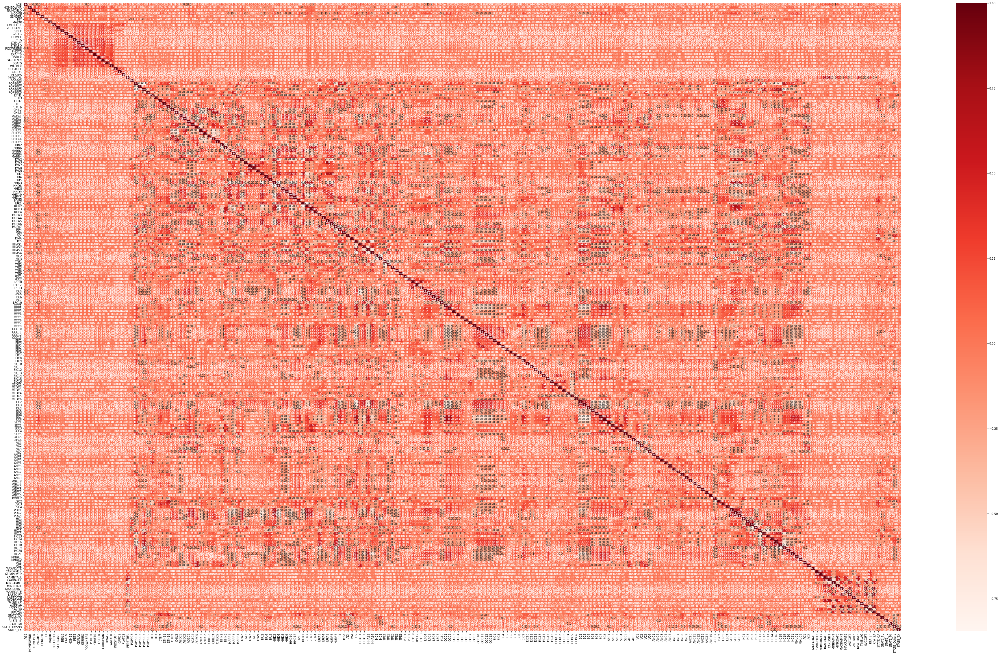

In [72]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(68,40))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = numeric_data.corr(method ='spearman')
cor_heatmap(cor_spearman)

#do this after the split in different types and see which ones can be dropped


In [73]:
#df1.drop(['NEXTDATE', 'AVGGIFT'], axis=1, inplace=True)  #high corr with 3 other variables

In [74]:
std_data.shape[0]/data.shape[0] 

0.9736720747914308

In [75]:
std_data.describe(include='all')

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
count,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900

#demographic: 'AGE', 'NUMCHLD', 'STATE', 'HOMEOWNR', 'GENDER', 'INCOME', 'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX'


#summary:  'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR'


#census: 'POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 'ETH11', 'ETH16', 'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'MSA', 'ADI', 'DMA', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2'    

-PCA?


#interests:  'HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS', 'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES', 'PEPSTRFL'

### Outliers

In [76]:
import seaborn as sns
from math import ceil

In [77]:
numeric_data = std_data.select_dtypes(include=[np.number]).copy()

In [78]:
numeric_data.drop(['HOMEOWNR','GENDER',
 'COLLECT1',
 'VETERANS',
 'BIBLE',
 'CATLG',
 'HOMEE',
 'PETS',
 'CDPLAY',
 'STEREO',
 'PCOWNERS',
 'PHOTO',
 'CRAFTS',
 'FISHER',
 'GARDENIN',
 'BOATS',
 'WALKER',
 'KIDSTUFF',
 'CARDS',
 'PLATES',
 'PEPSTRFL',
 'STATE_CA',       
'STATE_FL',        
'STATE_IL',       
'STATE_MI',        
'STATE_Others','STATE_TX', 'RFA_2A', 'MAJOR','RFA_2F'], axis=1, inplace=True)

#encoders and binaries are not metric features

In [79]:
df_outliers2 = numeric_data.copy()

q25 = df_outliers2.quantile(.25)
q75 = df_outliers2.quantile(.75)
iqr = (q75 - q25) * 2.5

upper_lim = q75 + 7 * iqr
lower_lim = q25 - 7 * iqr

filters = []
for metric in numeric_data:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(df_outliers2[metric].between(llim, ulim, inclusive=True))

df_outliers3 = df_outliers2[np.all(filters, 0)]
print('Percentage of data kept after removing outliers:', np.round(df_outliers3.shape[0] / data.shape[0], 4))

#too much data lost

Percentage of data kept after removing outliers: 0.1575


In [80]:
from scipy import stats

In [81]:
z_scores = stats.zscore(df_outliers2)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 10).all(axis=1)
new_df = df_outliers[filtered_entries]

print('Percentage of data kept after removing outliers:', np.round(new_df.shape[0] / data.shape[0], 4))

new_df

Percentage of data kept after removing outliers: 0.9279


,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,0,4,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,59.0,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,0,1,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13

In [82]:
df_outliers2[filtered_entries == False]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
134891,0.578947,0.0,0.0,5.666667,-0.453856,-1.000000,99.0,0.000000,-0.666667,0.333333,1.0,0.0,0.0,-0.5,1.333333,0.166667,2.8,-0.875,-0.142857,0.00,-0.2,-0.666667,-0.666667,0.75,0.75,0.25,-0.571429,5.666667,-1.4,-0.8,1.375,0.257143,2.000000,0.0,0.0,0.0,-0.12,0.000,0.1250,0.75,-0.272727,-1.0,-0.2,-0.857143,0.75,0.0,0.0,1.5,1.5,1.0,0.000000,-0.444444,0.428571,0.466667,0.0,-0.166667,-0.615809,0.542056,0.567227,-0.728914,0.058824,-0.666667,0.000000,0.272727,0.25,0.250000,0.250000,-0.625,0.0,1.00,0.000000,-0.5,-0.260870,-1.571429,-0.4,-2.227273,-0.1875,-0.5625,0.352941,0.30,-0.444444,0.6,-0.555556,0.333333,1.166667,-0.428571,0.0,1.5,1.333333,-0.750,-0.714286,1.25,-0.333333,1.00,-1.00,-0.923077,-0.25,1.333333,0.50,0.714286,-0.2,-0.333333,3.0,1.5,-1.0,2.0,-0.25,0.75,0.6,2.00,0.333333,0.4,-0.769231,0.0,-0.666667,-0.727273,-1.071429,0.555556,0.6,1.461538,1.428571,-0.75,3.125,0.0,1.000000,3.50,-1.000000,-0.5,-1.294118,1.181818,2.095238,-0.750000,0.0,8.8,-1.0,-0.250,0.0,0.0,-0.75,-0.5,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.68750,-0.25,1.0,-0.333333,0.571429,1.041667,1.466667,1.2,2.000000,0.466667,-0.057692,-0.323944,-0.285714,-0.153846,9.50,1.8,-0.055556,0.076923,0.0,-0.4,-0.666667,0.0,-0.666667,0.50,0.0,0.0,-0.5,-0.033333,-0.2,0.000000,0.059317,-0.222222,0.399123,0.0,1.196078,-0.254632,-0.333333,-0.151177
190166,0.000000,0.0,0.0,0.000000,0.149178,-0.656566,0.0,1.222222,0.000000,-0.133333,0.0,0.0,0.0,0.5,-0.833333,0.500000,-0.6,0.000,-0.285714,0.00,1.6,0.333333,0.333333,-0.50,-0.25,0.25,2.285714,-0.333333,-0.4,-0.8,-0.500,0.000000,-0.333333,0.0,0.0,0.0,0.12,1.500,3.7500,0.55,-0.272727,0.0,0.2,-0.285714,0.50,0.0,-0.2,0.2,0.0,0.0,0.000000,-0.222222,0.142857,0.933333,0.0,0.400000,0.593750,-0.196262,-0.268908,0.079422,0.235294,-0.166667,0.458333,-0.363636,-2.65,4.250000,1.083333,-0.500,0.0,-0.75,-0.333333,-0.5,0.086957,0.000000,0.2,0.727273,-0.6250,0.2500,-0.117647,0.30,0.000000,0.1,0.111111,0.333333,1.333333,0.285714,0.0,1.5,0.000000,0.000,-0.428571,-0.25,-0.666667,0.00,1.00,-0.538462,0.00,0.333333,0.00,1.857143,-0.2,0.000000,0.0,-0.5,0.2,-0.2,-0.25,0.75,1.2,0.00,0.000000,-0.2,-0.076923,0.4,-0.333333,0.363636,0.642857,0.222222,-0.2,-0.230769,0.142857,0.50,-1.125,0.5,-1.142857,0.00,0.416667,1.0,-0.705882,-0.181818,0.523810,1.083333,1.0,0.2,0.0,0.250,0.0,0.0,0.50,2.5,0.0,2.0,0.0,0.0,-1.0,0.0,1.0,-1.31250,0.00,0.0,2.333333,0.285714,0.541667,0.000000,-1.0,14.333333,2.766667,-0.557692,-0.845070,-0.285714,2.000000,0.00,-0.2,-0.055556,0.076923,0.0,0.2,0.000000,0.0,0.333333,1.75,62.0,-4.0,-4.0,0.033333,-0.4,2.857143,-0.058672,1.444444,0.000000,1.5,1.196078,-0.364017,-0.666667,2.133690
190313,0.000000,0.0,0.0,0.000000,0.065740,0.000000,0.0,0.000000,0.000000,0.066667,0.0,0.0,0.0,0.5,-0.333333,-0.666667,-0.8,1.500,2.000000,0.25,-1.2,0.333333,1.666667,-0.25,-0.25

### PCA

### Take outliers with PCA
https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/
https://stats.stackexchange.com/questions/328109/k-means-does-it-make-sense-to-remove-the-outliers-after-clustering-the-datasets

In [83]:
df_pca1 = numeric_data.copy()
df_pca1

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.572139
15078,0.000000,0.0,-0.5,0.666667,2.630847,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.0,-0.5,0.166667,0.666667,0.2,-0.250,-0.142857,0.50,0.2,-0.166667,-0.666667,-0.50,

In [84]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca1)
pca_feat  

array([[ 2.15820112e+01, -2.73090900e+00,  5.05762921e+00, ...,
         7.03039655e-03, -4.45604438e-02, -4.25042340e-04],
       [-1.58431278e+01,  4.46034611e+01, -3.28529662e+00, ...,
        -2.83861366e-04, -4.40556153e-03,  1.16622181e-03],
       [-1.14432312e+01, -5.30589709e+00,  1.63433363e+00, ...,
        -3.03387750e-03, -1.45557504e-02,  4.10368243e-03],
       ...,
       [-1.35325867e+01, -4.33244154e+00, -1.61351019e+00, ...,
        -1.95945876e-02,  1.81454789e-02, -1.93836580e-03],
       [-1.37713185e+01,  1.50245424e+00,  3.40542305e+00, ...,
         2.89696577e-03, -1.39462439e-02, -1.61546585e-04],
       [-1.37275005e+01, -2.04426428e+00, -2.77728089e+00, ...,
         2.78114459e-02, -9.30712739e-03, -9.17551820e-03]])

In [85]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,985.097462,0.000000,6.858683e-01,0.685868
2,86.795535,-898.301927,6.043088e-02,0.746299
3,55.599142,-31.196393,3.871058e-02,0.785010
4,22.478665,-33.120477,1.565064e-02,0.800660
5,19.235936,-3.242729,1.339291e-02,0.814053
6,17.157695,-2.078241,1.194594e-02,0.825999
7,15.323502,-1.834193,1.066890e-02,0.836668
8,12.941894,-2.381608,9.010718e-03,0.845679
9,11.325065,-1.616829,7.885010e-03,0.853564
10,10.807178,-0.517887,7.524434e-03,0.861088


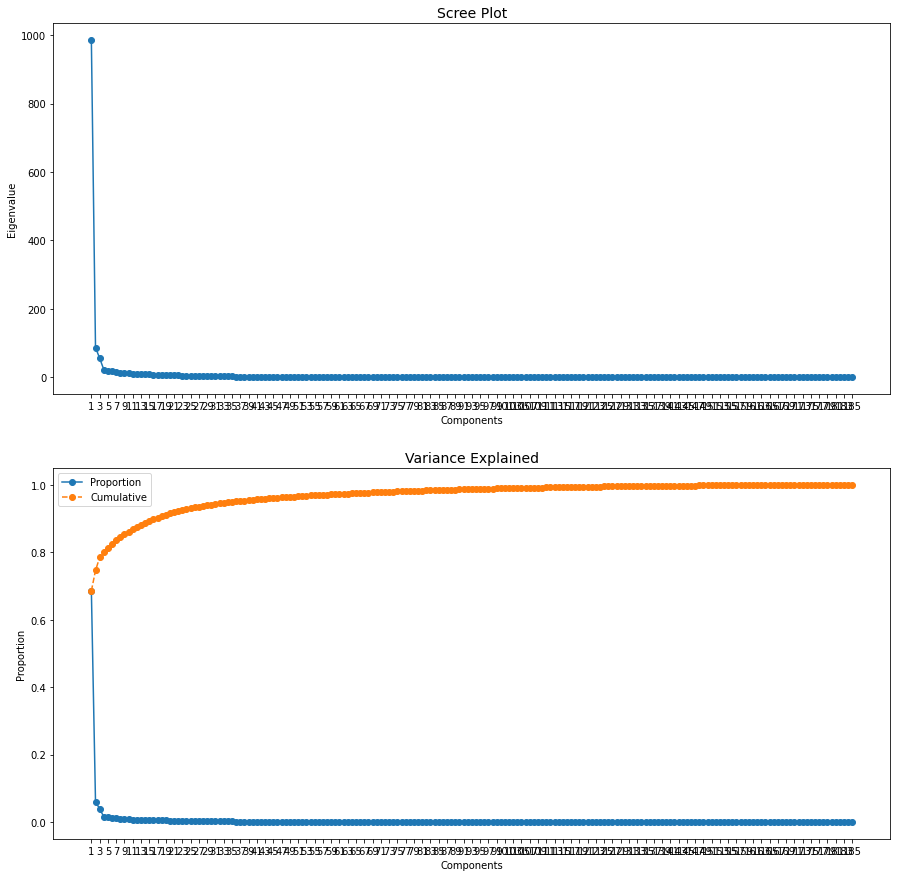

In [86]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

#6

In [87]:
pca = PCA(n_components=12)
pca_feat = pca.fit_transform(df_pca1)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca1.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
148535,-15.843128,44.603461,-3.285297,-0.483247,2.805077,-0.796896,-0.860414,-5.878408,3.254764,-2.462410,3.727859,2.548795
15078,-11.443231,-5.305897,1.634334,-4.160338,4.935580,-1.370563,-0.275384,-1.846478,-3.596998,1.169127,0.715119,-0.425222
172556,-5.767034,0.616742,1.542047,5.489760,8.172673,-1.089571,-0.056420,-6.036136,-3.606035,0.917104,4.295808,-1.433449
7112,-13.515878,-4.318861,-1.692467,1.681362,-1.252249,-0.137727,-2.743207,0.802292,1.345148,-1.243398,13.483000,13.992154
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-13.621294,-3.301818,-1.564135,3.348465,-0.100576,0.447662,0.213841,1.150011,6.060270,-0.566068,-6.114868,-0.808635
122706,-13.888983,-0.493511,-2.959033,-2.217684,-1.602843,1.845626,0.075284,-3.374869,3.519383,-1.498196,-0.597982,-0.893708
189641,-13.532587,-4.332442,-1.613510,2.369486,-1.478527,0.124135,-0.677179,-1.653201,0.909387,-1.545309,-0.716077,-0.009363


In [88]:
# Reassigning df to contain pca variables
df_pca1 = pd.concat([df_pca1, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca1.head()

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.0,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.5,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.50,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.0,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.0,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.25,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.572139,-15.84312

In [89]:
metric_features = numeric_data.columns.tolist()

def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca1[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
AGE,0.039035,0.016014,0.019399,-0.024474,-0.011721,-0.017696,-0.007748,0.104394,-0.071666,0.014802,0.076837,0.079527
NUMCHLD,-0.002574,-0.027837,-0.032151,-0.006787,-0.017996,0.011057,-0.022390,-0.065880,0.050652,-0.048702,0.013994,0.005590
INCOME,-0.072806,0.215343,-0.065912,-0.107969,-0.083847,0.067366,-0.005533,-0.081799,0.197504,-0.043417,0.001207,-0.048137
HIT,0.009362,0.009554,-0.011198,-0.032880,-0.124548,0.028886,-0.080131,0.123279,0.125243,-0.134008,0.651419,0.638065
POP903,0.013516,0.031400,0.021810,0.101787,-0.023511,-0.006258,0.016024,-0.046984,-0.004242,0.077732,-0.244952,-0.092165
POP90C1,-0.546076,0.194847,0.027416,0.307183,-0.474209,-0.012733,-0.006265,0.146281,0.198881,-0.113078,-0.016966,0.020359
POP90C2,0.999897,0.013222,-0.004846,0.001193,-0.000519,0.000637,0.000140,-0.000190,0.000382,-0.000043,0.000376,-0.000671
POP90C3,-0.132178,-0.239714,-0.034330,-0.368441,0.543849,0.011404,0.006545,-0.181072,-0.236486,0.133498,0.005368,-0.016123
POP90C5,0.098677,0.006461,-0.148651,0.009375,-0.227839,-0.055057,-0.008511,0.323575,-0.140525,0.040982,-0.010674,0.053209
ETH1,0.062655,-0.019225,-0.119912,-0.623748,-0.093976,0.184315,-0.010033,0.134167,-0.013669,0.011115,0.014315,-0.108952


In [90]:
df = df_pca1.copy()
df_pca2 = pd.concat([df_pca1, std_data[categorical_data]], axis=1)  #depois arranjar, 
df_pca2

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.57

In [91]:
# Do this after checking the new pandas profiling report
#df_pca2.drop(columns=['PC11], inplace=True)

In [92]:
pc_features = df_pca2.columns[df_pca2.columns.str.startswith('PC')]#.drop(['PCOWNERS'])
df_pca2[pc_features]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
148535,-15.843128,44.603461,-3.285297,-0.483247,2.805077,-0.796896,-0.860414,-5.878408,3.254764,-2.462410,3.727859,2.548795
15078,-11.443231,-5.305897,1.634334,-4.160338,4.935580,-1.370563,-0.275384,-1.846478,-3.596998,1.169127,0.715119,-0.425222
172556,-5.767034,0.616742,1.542047,5.489760,8.172673,-1.089571,-0.056420,-6.036136,-3.606035,0.917104,4.295808,-1.433449
7112,-13.515878,-4.318861,-1.692467,1.681362,-1.252249,-0.137727,-2.743207,0.802292,1.345148,-1.243398,13.483000,13.992154
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-13.621294,-3.301818,-1.564135,3.348465,-0.100576,0.447662,0.213841,1.150011,6.060270,-0.566068,-6.114868,-0.808635
122706,-13.888983,-0.493511,-2.959033,-2.217684,-1.602843,1.845626,0.075284,-3.374869,3.519383,-1.498196,-0.597982,-0.893708
189641,-13.532587,-4.332442,-1.613510,2.369486,-1.478527,0.124135,-0.677179,-1.653201,0.909387,-1.545309,-0.716077,-0.009363


https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/

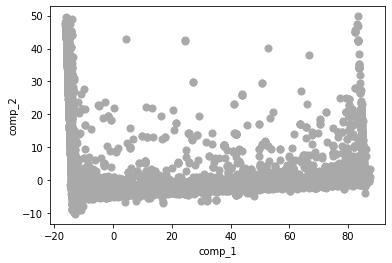

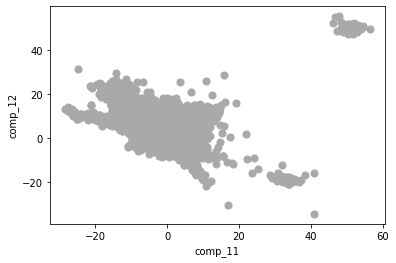

In [93]:
df9 = pd.DataFrame(pca_feat, columns=['comp_'+str(j+1) for j in range(12)])
first_two = df9.plot(kind='scatter', x='comp_1', y='comp_2', c='DarkGrey', s=50)
last_two = df9.plot(kind='scatter', x='comp_11', y='comp_12', c='DarkGrey', s=50)

Looking at these two scatterplots of the first and last components. Looking at the data points along the axis, it can be seen a possible threshold to use for separating regular data from suspect data (possible outliers).

Using the two last components that we kept, it can be located a few points to investigate using the threshold of 1.4 for the last component and of 1.3 for the nith. All cases above these values are possible outliers.


In [94]:
df

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.57

In [95]:
outlying = (pca_feat[:,-1] < 1.4) & (pca_feat[:,-4] < 1.3)
df[outlying]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
15078,0.000000,0.0,-0.5,0.666667,2.630847,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.0,-0.5,0.166667,0.666667,0.2,-0.250,-0.142857,0.50,0.2,-0.166667,-0.666667,-0.50,0.50,1.00,0.285714,-0.333333,-0.2,0.4,-0.250,-0.085714,0.000000,3.0,3.0,0.0,-0.08,0.125,0.8125,0.15,0.000000,1.0,0.0,-0.142857,-0.25,0.0,0.4,-0.3,0.0,1.0,1.846154,0.111111,0.000000,0.066667,3.0,-1.400000,-0.615809,0.495327,-0.491597,-0.300988,0.117647,0.666667,-0.500000,0.272727,0.45,-0.166667,-0.416667,1.250,0.0,-0.25,0.000000,0.0,0.434783,0.000000,0.4,-0.136364,-0.1250,0.1250,0.705882,0.60,0.000000,-0.3,-0.666667,-0.333333,-1.000000,-0.428571,0.0,0.0,-0.166667,0.875,2.142857,0.25,1.333333,1.25,1.25,1.307692,0.00,0.333333,-0.50,-0.714286,-0.6,-0.333333,-0.5,-0.5,-0.2,0.2,-0.75,-0.25,0.0,1.00,-0.333333,0.2,0.230769,-0.4,1.777778,0.727273,-0.071429,-0.555556,0.0,-0.538462,-0.285714,-0.50,0.000,-0.5,-0.285714,0.00,-0.833333,-0.5,-0.117647,0.454545,0.000000,-0.083333,1.0,1.8,0.0,-0.375,0.0,0.0,0.75,-0.5,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.78125,0.25,0.0,-0.666667,-0.428571,0.083333,0.666667,0.6,1.000000,0.233333,0.038462,-0.845070,0.571429,0.358974,11.00,2.8,4.222222,-1.500000,-2.0,-1.2,0.333333,0.0,0.000000,-0.25,0.0,0.0,1.0,1.388889,2.0,-0.428571,0.431979,-0.111111,2.335526,-1.0,0.000000,0.272564,1.000000,-0.5898

In [96]:
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from collections import Counter

https://www.datasciencelearner.com/projection-detecting-outliers-dbscan-method/

In [97]:
# Based on the hyperparameters found in the previous class
dbscan = DBSCAN(eps=7.3, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_pca2[pc_features])
Counter(dbscan_labels)


#5618 com 6
#3634 com 7
#3225 com 7.3

Counter({0: 89429, 1: 206, -1: 3227, 2: 38})

In [98]:
(92900-3225)/data.shape[0]

0.9398712950153021

In [99]:
df_pca2[dbscan_labels==-1]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
190313,0.000000,0.0,0.0,0.000000,0.065740,0.0,0.0,0.000000,0.000000,0.066667,0.0,0.0,0.0,0.5,-0.333333,-0.666667,-0.8,1.500,2.000000,0.25,-1.2,0.333333,1.666667,-0.25,-0.25,-1.00,-1.428571,1.000000,-1.0,-1.2,-0.500,0.771429,-0.333333,0.0,0.0,0.0,-0.84,-0.250,-0.1250,1.30,-1.000000,0.0,-0.4,-1.000000,-0.75,1.0,-0.4,1.8,3.0,0.0,0.000000,-0.777778,-0.285714,-0.133333,0.0,0.433333,-0.079044,0.121495,-0.071429,0.802362,-1.235294,-0.666667,0.916667,-0.454545,-1.35,1.250000,0.833333,-0.375,0.0,-0.50,0.000000,0.0,3.086957,2.142857,3.6,0.272727,1.5625,0.7500,0.117647,0.55,-0.444444,2.1,1.333333,0.333333,-0.333333,-0.428571,0.0,0.5,-0.166667,-0.875,-0.571429,-0.75,-1.000000,-0.25,-1.00,0.692308,0.25,0.000000,0.00,-1.285714,0.4,1.333333,-1.5,1.0,0.4,0.2,0.75,0.00,0.4,-0.50,1.000000,-0.4,0.384615,-0.2,-0.666667,-1.000000,-1.214286,0.444444,0.8,2.076923,1.142857,0.50,1.250,2.0,1.000000,0.25,0.500000,0.5,1.647059,-0.636364,-0.761905,0.083333,0.0,-0.2,0.0,0.875,0.0,0.0,-0.25,0.5,0.0,1.0,0.0,0.0,-1.0,1.0,0.0,-0.34375,-0.25,0.5,-0.333333,0.571429,1.166667,0.333333,-0.6,2.000000,2.300000,-0.461538,0.211268,-0.285714,-0.025641,0.00,0.8,0.166667,-0.096154,0.0,0.2,1.333333,2.0,-1.666667,0.00,92.0,-6.0,-5.0,-0.100000,0.4,-0.428571,0.805287,-0.777778,1.932018,-0.8,0.000000,0.272564,0.500000,-0.774323,-13.941405,-1.878322,-3.663528,-4.167756,-6.613587,6.639881,91.128442,-4.390624,5.630019,-0.403065,5.085854,2.195058
146222,0.000000,0.0,0.0,0.000000,-0.428571,0.0,0.0,0.000000,-1.000000,-2.933333,0.0,0.0,1.0,2.5,-1.000000,1.000000,1.8,1.875,-0.571429,-1.00,-1.4,-0.166667,0.000000,-0.25,-1.00,1.75,-1.285714,4.333333,1.2,-0.2,1.750,-0.742857,2.000000,20.0,0.0,20.0,2.00,0.125,-0.3125,-1.15,2.090909,2.0,1.2,1.428571,1.00,3.5,3.8,-1.6,0.0,4.0,0.000000,1.888889,2.000000,1.933333,0.0,0.133333,0.477022,-0.757009,0.705882,-0.784034,0.058824,2.166667,-0.791667,3.454545,-0.45,1.000000,-2.000000,1.000,6.0,0.50,1.333333,-0.5,0.565217,0.285714,4.4,-1.318182,0.5625,0.0000,-0.588235,-1.15,2.000000,-0.7,-0.333333,-0.333333,-1.166667,-0.571429,2.0,-0.5,0.000000,0.750,0.428571,0.75,1.333333,3.00,-0.50,0.153846,-0.50,0.000000,1.00,-1.571429,0.2,3.000000,2.0,1.0,-1.2,-0.4,0.25,-0.25,0.4,-0.75,0.000000,1.0,0.230769,-0.2,1.777778,2.181818,-0.857143,-1.222222,-0.6,0.000000,-0.714286,1.00,-0.125,0.5,0.285714,-0.25,-0.750000,-0.5,0.588235,-0.454545,0.142857,-0.750000,1.0,-1.0,0.0,-0.875,0.0,0.0,-0.25,1.5,0.0,1.0,0.0,0.0,-1.0,0.0,0.0,-0.46875,11.75,2.0,-0.666667,-2.285714,-1.375000,-1.066667,-0.4,0.000000,-0.533333,1.000000,0.225352,1.285714,-0.230769,0.00,-0.2,-0.055556,0.076923,0.0,-2.0,1.333333,-2.0,0.000000,-0.25,0.0,-2.0,-1.0,-0.111111,-0.2,0.000000,0.941973,-0.222222,0.399123,0.0,1.594771,0.618649,0.500000,-0.2931

In [100]:
from sklearn.neighbors import LocalOutlierFactor
from numpy import quantile, where, random

lof = LocalOutlierFactor(n_neighbors=20, contamination=.04)
lof_labels = lof.fit_predict(df_pca2[pc_features])
Counter(lof_labels)

Counter({1: 89184, -1: 3716})

In [101]:
(92900-404)/data.shape[0]

0.969437806565212

In [102]:
outliers = df_pca2[lof_labels==-1].merge(df_pca2[dbscan_labels==-1], on='CONTROLN')
outliers_ = outliers.merge(df_pca2[filtered_entries == False], on='CONTROLN')
outliers_.index

Int64Index([190313, 185130, 183367,  43238, 191754, 105012, 162938, 190422,
            160343,  13048,
            ...
              7916, 142523, 153299, 139169, 190314, 190309, 139107, 178153,
             33495, 142478],
           dtype='int64', name='CONTROLN', length=405)

### Remove the outliers to the non standardized dataset
<a class="anchor" id="out">

In [124]:
df_.drop(outliers_.index, axis=0,inplace=True)
df_

In [126]:
df_.to_csv('sem_outliers.csv')

In [128]:
#correr isto para importar o df sem outliers 
df_ = pd.read_csv('sem_outliers.csv')

### Divide the data by different perspectives

In [105]:
df_.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92900 entries, 95515 to 185114
Data columns (total 215 columns):
 #   Column        Dtype  
---  ------        -----  
 0   AGE           float64
 1   HOMEOWNR      int64  
 2   NUMCHLD       float64
 3   INCOME        float64
 4   GENDER        int64  
 5   HIT           int64  
 6   MAJOR         int64  
 7   COLLECT1      int64  
 8   VETERANS      int64  
 9   BIBLE         int64  
 10  CATLG         int64  
 11  HOMEE         int64  
 12  PETS          int64  
 13  CDPLAY        int64  
 14  STEREO        int64  
 15  PCOWNERS      int64  
 16  PHOTO         int64  
 17  CRAFTS        int64  
 18  FISHER        int64  
 19  GARDENIN      int64  
 20  BOATS         int64  
 21  WALKER        int64  
 22  KIDSTUFF      int64  
 23  CARDS         int64  
 24  PLATES        int64  
 25  PEPSTRFL      int64  
 26  POP903        int64  
 27  POP90C1       int64  
 28  POP90C2       int64  
 29  POP90C3       int64  
 30  POP90C5       in

In [106]:
demographic = ['AGE', 'NUMCHLD', 'HOMEOWNR', 'GENDER', 'INCOME', 
              'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX']


summary = [ 'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 
           'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 
           'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR']


census = ['POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 'ETH11', 'ETH16', 
          'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 
          'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 
          'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 
          'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'MSA', 'ADI', 'DMA', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 
          'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 
          'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 
          'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 
          'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 
          'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 
          'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 
          'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 
          'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2']    




interests = ['HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS',
             'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES', 'PEPSTRFL']


df_dem = df_[demographic].copy()
df_sum = df_[summary].copy()
df_cen = df_[census].copy()
df_int = df_[interests].copy()

In [107]:
df_dem

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,
95515,60.0,0.0,0,0,NaN,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1.0,1,1,6.0,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0.0,0,1,3.0,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0.0,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1.0,1,0,3.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
184568,NaN,0.0,0,1,NaN,0.0,0.0,0.0,0.0,1.0,0.0
122706,47.0,1.0,1,1,7.0,0.0,0.0,0.0,0.0,0.0,1.0
189641,59.0,0.0,0,1,NaN,0.0,0.0,0.0,1.0,0.0,0.0


In [108]:
imp_mean = IterativeImputer(random_state=0)
df_complete = imp_mean.fit_transform(df_dem[df_dem.columns])
df_dem[df_dem.columns] = df_complete

In [109]:
#arrendondar unidade
to_round = ['AGE', 'NUMCHLD', 'INCOME']

df_dem[to_round] = df_dem[to_round].apply(np.ceil).astype(int)

#, 'NEXTDATE', 'TIMELAG'

In [110]:
df_dem

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,
95515,60,0,0.0,0.0,3,0.0,0.0,1.0,0.0,0.0,0.0
148535,45,1,1.0,1.0,6,1.0,0.0,0.0,0.0,0.0,0.0
15078,61,0,0.0,1.0,3,0.0,0.0,0.0,0.0,1.0,0.0
172556,69,0,0.0,0.0,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77,1,1.0,0.0,3,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
184568,61,0,0.0,1.0,3,0.0,0.0,0.0,0.0,1.0,0.0
122706,47,1,1.0,1.0,7,0.0,0.0,0.0,0.0,0.0,1.0
189641,59,0,0.0,1.0,3,0.0,0.0,0.0,1.0,0.0,0.0


In [111]:
df_complete1 = imp_mean.fit_transform(df_sum[df_sum.columns])
df_sum[df_sum.columns] = df_complete1

In [112]:
#arrendondar unidade
to_round1 = ['NEXTDATE', 'TIMELAG']

df_sum[to_round1] = df_sum[to_round1].apply(np.ceil).astype(int)

In [113]:
df_sum

,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,MAJOR
CONTROLN,,,,,,,,,,,,,,,,,
95515,333.0,6.0,14.0,240.0,14.0,5.0,1978.0,12.0,1429.0,10.0,761.0,2862,4,7.741935,4.0,1.0,0.0
148535,333.0,6.0,13.0,47.0,1.0,10.0,1552.0,25.0,761.0,25.0,761.0,1005,18,15.666667,2.0,3.0,0.0
15078,333.0,6.0,14.0,202.0,14.0,2.0,2252.0,16.0,2009.0,5.0,761.0,2556,12,7.481481,4.0,1.0,0.0
172556,333.0,6.0,14.0,109.0,7.0,2.0,3713.0,11.0,1156.0,10.0,761.0,3713,9,6.812500,4.0,1.0,0.0
7112,333.0,10.0,25.0,254.0,8.0,3.0,1552.0,15.0,730.0,15.0,730.0,6453,14,6.864865,2.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,333.0,5.0,12.0,25.0,0.0,25.0,699.0,25.0,699.0,25.0,699.0,710,11,25.000000,1.0,3.0,0.0
122706,333.0,3.0,8.0,20.0,0.0,20.0,670.0,20.0,670.0,20.0,670.0,810,11,20.000000,1.0,2.0,0.0
189641,333.0,7.0,17.0,58.0,4.0,3.0,670.0,10.0,1095.0,10.0,456.0,1095,3,8.285714,3.0,1.0,0.0


In [114]:
df_dem.reset_index(inplace=True)
dem = df_dem.columns.to_list()
dem.remove('CONTROLN')

df_sum.reset_index(inplace=True)
sum_ = df_sum.columns.to_list()
sum_.remove('CONTROLN')

df_cen.reset_index(inplace=True)
cen = df_cen.columns.to_list()
cen.remove('CONTROLN')

df_int.reset_index(inplace=True)
int_ = df_int.columns.to_list()
int_.remove('CONTROLN')

In [115]:
scaler = RobustScaler()
df_dem[dem] = pd.DataFrame(scaler.fit_transform(df_dem[dem]), columns = dem)

scaler1 = RobustScaler()
df_sum[sum_] = pd.DataFrame(scaler1.fit_transform(df_sum[sum_]), columns = sum_)

scaler2 = RobustScaler()
df_cen[cen] = pd.DataFrame(scaler2.fit_transform(df_cen[cen]), columns = cen)

scaler3 = RobustScaler()
df_int[int_] = pd.DataFrame(scaler3.fit_transform(df_int[int_]), columns = int_)

In [116]:
df_dem.set_index(['CONTROLN'],inplace=True) #unique number 
df_sum.set_index(['CONTROLN'],inplace=True)
df_cen.set_index(['CONTROLN'],inplace=True)
df_int.set_index(['CONTROLN'],inplace=True)

## Correlations between the variables

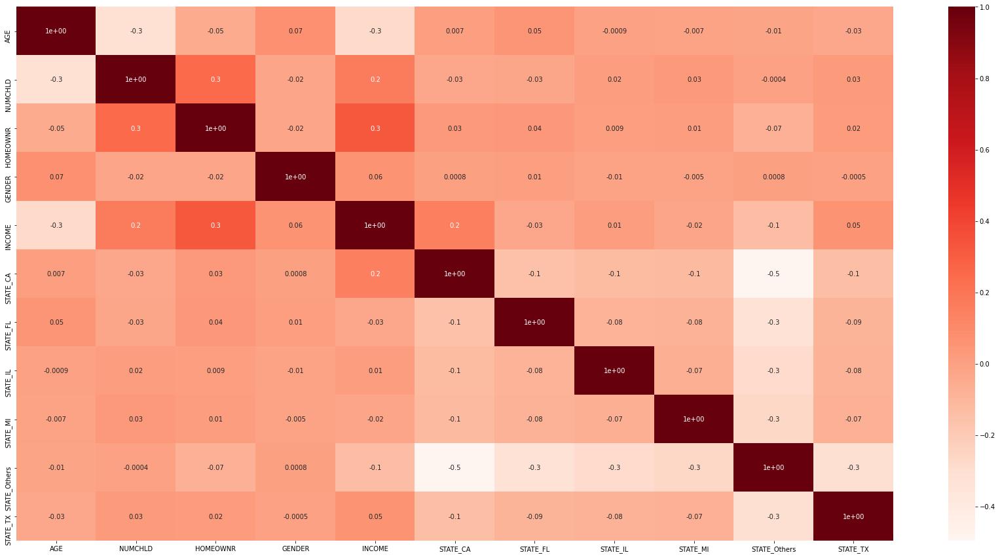

In [117]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_dem.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [118]:
#dos state_CA é a unica que pode ser importante?
#gender tambem faria drop

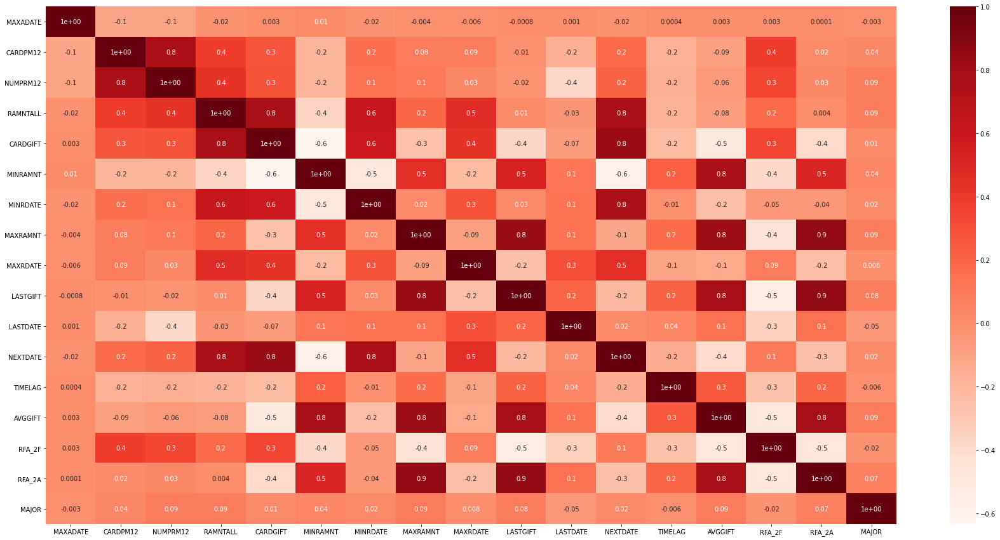

In [119]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_sum.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [120]:
#major daria drop
#maxadate tambem

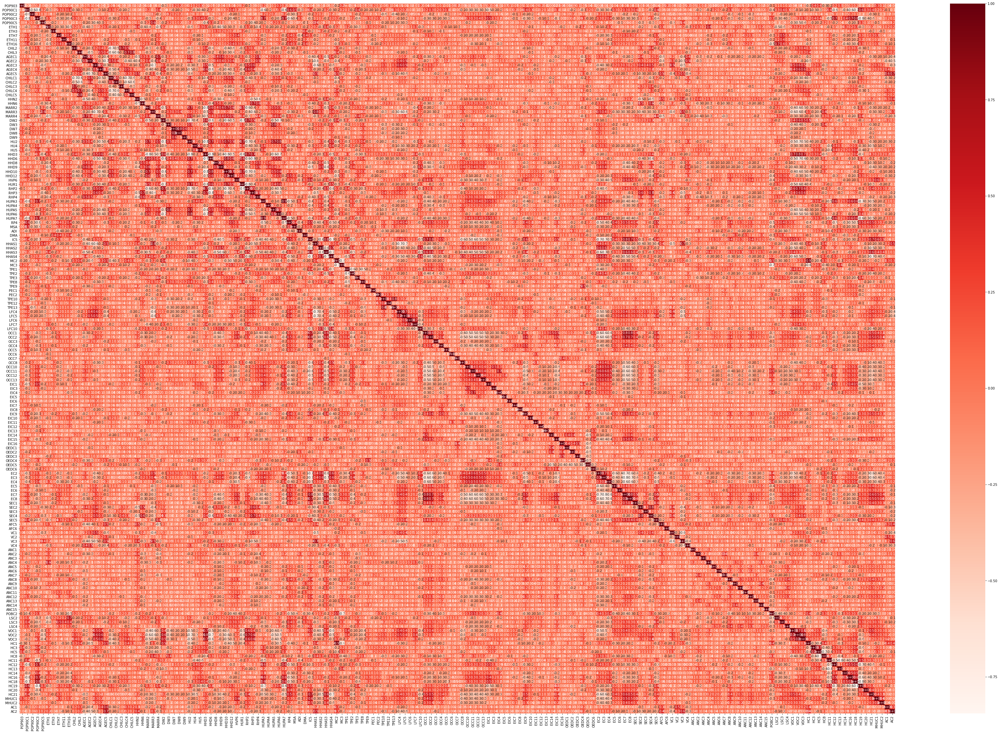

In [121]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(60,40))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_cen.corr(method ='spearman')
cor_heatmap(cor_spearman)

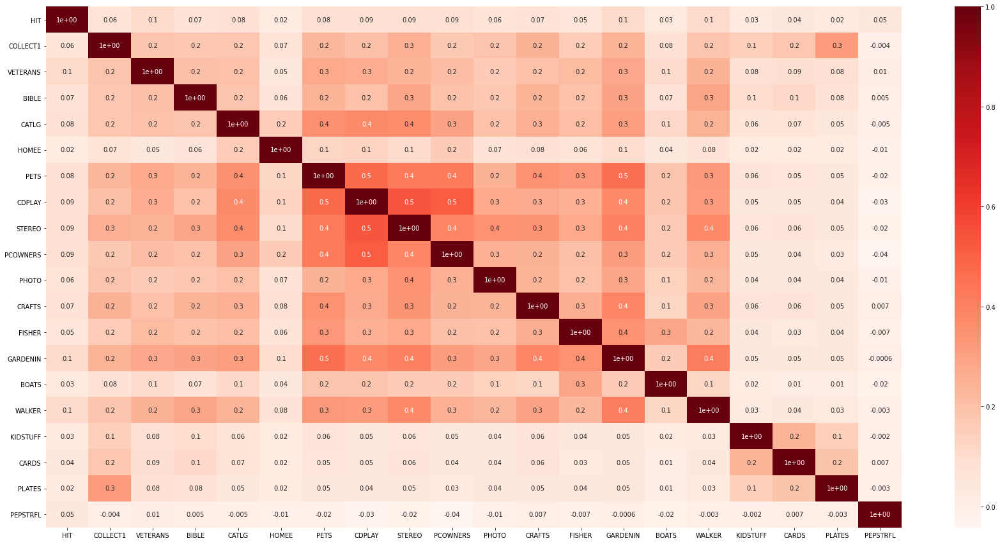

In [122]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_int.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [123]:
#PEPSTRFL, HOMEE E HIT FAZER DROP

## Testing on K-means and Hierarchical clustering


In [225]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

### Defining the linkage method to choose

In [226]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [121]:
df_pca2[pc_features]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC15,PC16,PC17,PC18
CONTROLN,,,,,,,,,,,,,,,,,,
95515.0,-1.746919,2.145093,-0.422989,0.068301,0.011819,0.805650,-1.370403,0.105288,-0.181357,-0.726256,0.494264,0.515213,-0.789701,-0.916917,-0.210198,0.014329,0.224788,0.108600
148535.0,-0.569159,-1.695333,1.050758,-0.844739,0.240825,-2.056312,-0.255034,1.308584,0.769771,-0.001295,1.243064,0.784370,-0.916666,0.194368,0.254964,-0.841962,0.670088,-0.050891
148547.0,5.017742,0.296742,0.253834,-0.360100,-1.607898,-0.283913,-0.414486,2.463806,-0.483175,-0.952619,0.012892,1.249300,-0.431753,0.473408,-1.198756,1.708242,1.164358,-0.529078
15078.0,-1.615425,2.591653,-0.902871,0.454226,0.053314,0.003671,-0.088597,-0.813959,-0.527011,0.402238,1.032376,0.223378,-1.017659,-1.433668,-0.596619,0.240746,0.182264,0.889575
15079.0,1.451263,0.063666,0.403770,-0.336869,-0.265220,-0.218131,-2.512913,-1.430294,-0.127909,0.668370,1.345891,-0.321813,-0.990353,-1.629647,-0.950667,0.075604,0.948678,-1.280888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47945.0,-1.416831,-1.196196,-0.423718,-1.329455,-0.084533,1.207029,-0.355178,-1.280399,-0.322363,0.494189,-1.128938,-0.906166,0.951535,0.391900,-0.086896,0.285400,-0.284273,-0.071658
84678.0,-1.253031,0.524310,-0.537318,1.380734,0.070808,-0.439913,-0.436108,-0.306769,0.411296,0.572503,-0.761335,-0.667202,0.792761,1.214358,0.646185,0.649990,-0.365363,-0.286419
156106.0,-1.436920,-1.929529,1.322370,-0.084849,-0.155363,1.177920,-0.224524,0.804043,0.989200,1.170894,-0.833034,-0.851862,0.752044,1.195786,-0.028453,0.060222,0.256581,0.966455


In [202]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 20
r2_hc_methods = np.vstack([get_r2_hc(df=df_pca2[pc_features], link_method=link, max_nclus=max_nclus) for link in hc_methods]).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

MemoryError: Unable to allocate 29.1 GiB for an array with shape (3909269253,) and data type float64

In [202]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 20
r2_hc_methods = np.vstack([get_r2_hc(df=df_pca2[pc_features], link_method=link, max_nclus=max_nclus) for link in hc_methods]).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

MemoryError: Unable to allocate 29.1 GiB for an array with shape (3909269253,) and data type float64

### Defining the number of clusters:


In [131]:
range_clusters = range(1, 15)

In [132]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_pca2[pc_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

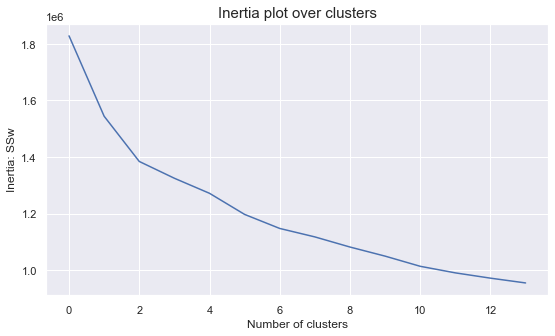

In [133]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

In [136]:
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram
import matplotlib.cm as cm

For n_clusters = 2, the average silhouette_score is : 0.2762101708918887
For n_clusters = 3, the average silhouette_score is : 0.1378296606582079
For n_clusters = 4, the average silhouette_score is : 0.13918522014859908
For n_clusters = 5, the average silhouette_score is : 0.10746556568174531
For n_clusters = 6, the average silhouette_score is : 0.10834448309922554
For n_clusters = 7, the average silhouette_score is : 0.11151941579789446
For n_clusters = 8, the average silhouette_score is : 0.09826162156194898
For n_clusters = 9, the average silhouette_score is : 0.1037752800653452
For n_clusters = 10, the average silhouette_score is : 0.08388313933385592
For n_clusters = 11, the average silhouette_score is : 0.08927131645693669
For n_clusters = 12, the average silhouette_score is : 0.09261580147899447
For n_clusters = 13, the average silhouette_score is : 0.08370545743493288
For n_clusters = 14, the average silhouette_score is : 0.0855730412875256


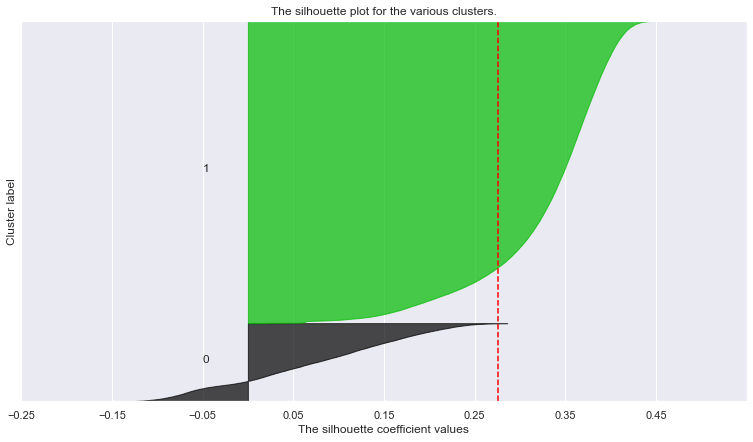

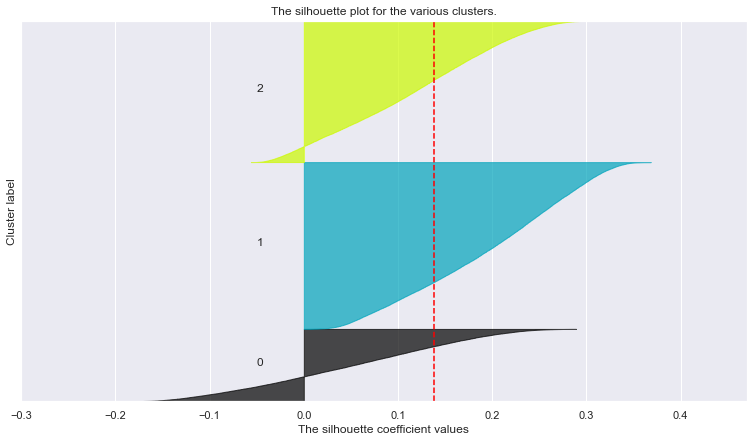

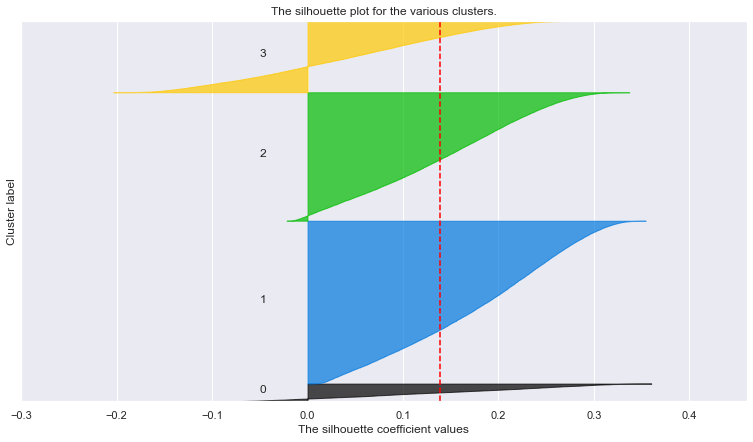

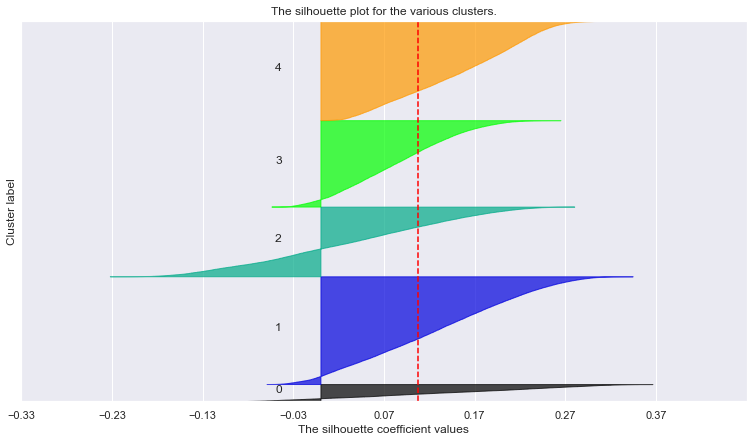

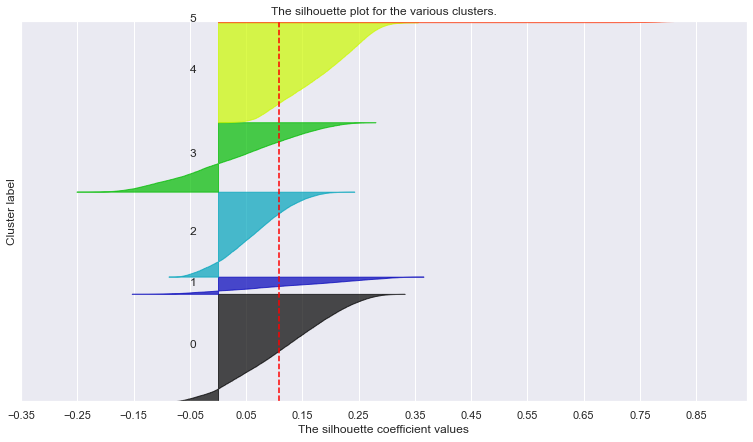

...

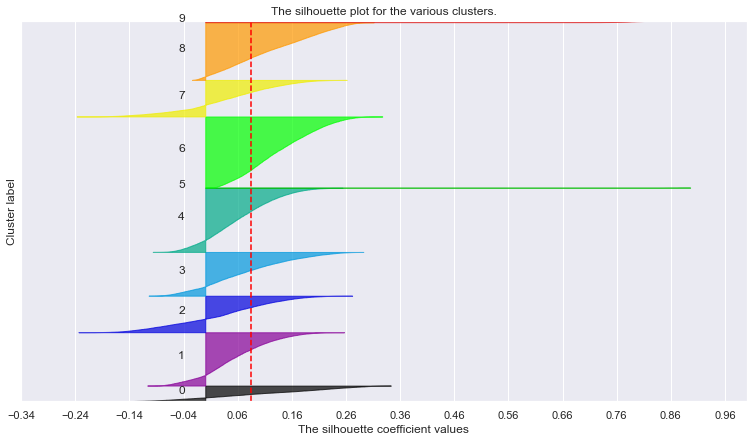

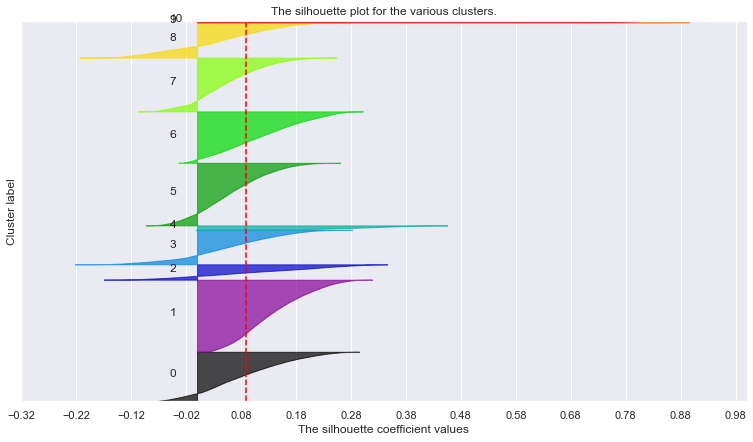

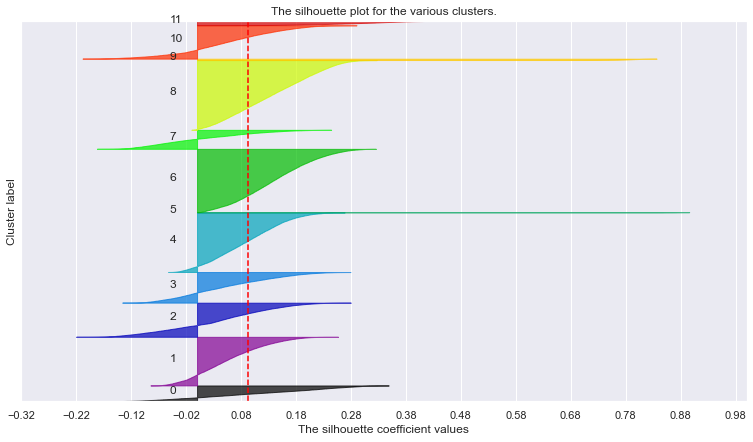

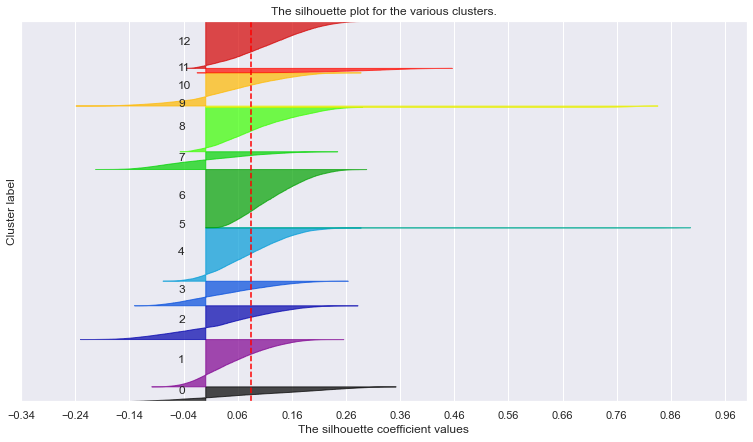

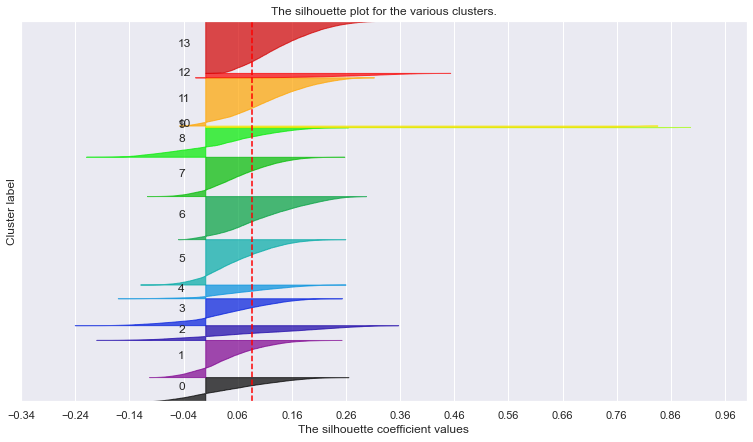

In [137]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_pca2[pc_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_pca2[pc_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_pca2[pc_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_pca2[pc_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

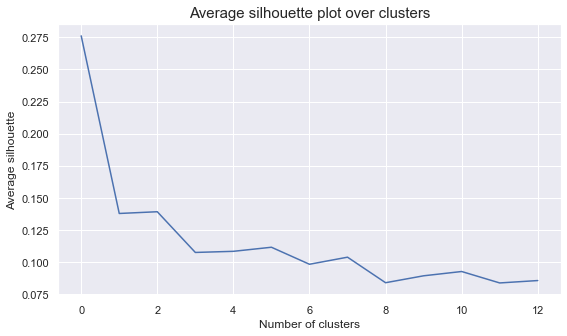

In [138]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

### Finding the optimal clusterer 

In [110]:
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz

sns.set()

In [115]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_pca2[pc_features], kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:  #hierarchical
    r2_scores[linkage] = get_r2_scores(
        df_pca2[pc_features], hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

MemoryError: Unable to allocate 29.1 GiB for an array with shape (3909269253,) and data type float64

### Kmeans

In [304]:
# final cluster solution
number_clusters = 4
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(df_pca2[pc_features])
km_labels

array([0, 2, 3, ..., 2, 2, 0])

In [305]:
pc_features

Index(['PC0', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9',
       'PC10', 'PC11', 'PC12', 'PC13', 'PC15', 'PC16', 'PC18'],
      dtype='object')

In [306]:
#anter de fazer isto tenho de fazer inertia e ver numero de clusters

In [307]:
# Characterizing the final clusters
df_concat2 = pd.concat((df_pca2, pd.Series(km_labels, name='labels')), axis=1)
df_concat2.groupby('labels').mean()

,TCODE,ZIP,AGE,HOMEOWNR,NUMCHLD,INCOME,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,TIMELAG,HPHONE_D,neighborhood,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC15,PC16,PC18
labels,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,0.004747,-0.778526,-0.002827,0.026228,0.030948,-0.047876,-0.000151,0.027102,0.014551,0.011762,0.048238,0.013873,-0.010045,0.002659,0.006646,0.019113,-0.016129,0.000074,0.037635,0.025121,0.022933,0.007972,0.016034,0.009512,0.001863,-0.006315,0.042699,-0.059800,0.083232,0.193136,0.057291,0.045394,-0.021724,0.027631,0.007712,0.026587,-0.005706,-0.039511,-0.018468,0.117374,0.009287,0.059566,0.192444,0.023642,-0.084905,0.033699,-0.023162,0.180085,-0.547305,-0.169648,0.210603,-0.007937,-0.005522,-0.112059,-0.267811,-0.077200,-0.142616,-0.031608
1.0,-0.035193,-0.756865,0.005818,0.052304,0.049701,-0.046342,-0.029268,0.083617,0.029000,0.058364,0.050844,-0.006083,0.018624,-0.013179,-0.044011,0.009321,-0.030746,-0.022267,-0.044448,0.027111,0.031487,0.073759,0.016226,0.056347,-0.010482,0.019546,0.041577,-0.059800,0.094960,0.176254,0.100958,0.074606,-0.006242,0.048884,0.031169,0.046356,0.060740,0.021928,-0.021067,0.166249,-0.054442,0.035851,0.216944,0.095981,-0.010918,0.083398,-0.052146,0.198401,-0.552929,-0.124188,0.167866,0.024668,-0.020730,-0.157835,-0.318746,-0.046202,-0.175138,-0.042491
2.0,-0.005023,-0.763488,0.009992,0.033856,0.011700,-0.039197,0.005421,0.036369,0.018172,0.020954,0.029097,0.014577,-0.001212,0.000384,0.003756,0.024200,-0.014856,0.014882,0.016315,0.017903,0.013509,0.030507,0.012252,0.001239,-0.004878,0.015022,0.059283,-0.059800,0.086956,0.223129,0.063980,0.074753,-0.047435,0.050387,-0.002924,0.046656,-0.009766,-0.041422,-0.008227,0.103124,0.010268,0.049545,0.244877,0.017967,-0.086864,0.031265,-0.027636,0.171365,-0.517059,-0.150108,0.203409,0.021406,-0.028978,-0.105682,-0.268244,-0.086986,-0.149035,-0.043692
3.0,0.003289,-0.783229,-0.000960,0.034845,0.007113,-0.049635,-0.010023,0.017164,0.013619,0.006531,0.021280,-0.000763,0.003212,-0.001126,-0.011160,-0.013258,-0.015440,-0.003494,0.012022,0.010192,-0.002020,0.001712,0.004219,0.001630,0.010267,-0.015705,0.048680,-0.056336,0.086071,0.208261,0.068140,0.064476,-0.037634,0.030145,0.010937,0.039228,-0.006245,-0.020349,-0.005998,0.094205,-0.004481,0.004993,0.210487,0.020660,-0.075905,0.034613,-0.029210,0.162424,-0.525917,-0.166173,0.214775,0.008740,-0.009623,-0.116912,-0.283038,-0.073385,-0.159795,-0.039820


In [308]:
df_pca2['pc_feature'] = km_labels

In [309]:
df_pca2[pc_features.to_list() +['pc_feature']]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC15,PC16,PC18,pc_feature
CONTROLN,,,,,,,,,,,,,,,,,,
95515.0,-1.746873,2.145076,-0.421548,0.071450,0.014100,0.808486,-1.368334,0.134907,-0.171827,-0.714645,0.172427,0.729790,-0.641092,-0.993480,-0.142218,0.060894,0.249595,0
148535.0,-0.569197,-1.694881,1.050618,-0.832671,0.274501,-2.037516,-0.245218,1.400511,0.799919,-0.021548,0.811335,1.142470,-0.605262,-0.009087,0.305026,0.604822,0.538322,2
148547.0,5.017778,0.295748,0.254530,-0.366922,-1.593325,-0.289863,-0.413736,2.359916,-0.409661,-1.005597,-0.123318,1.340761,-0.519186,0.526726,-1.469418,-2.093215,-0.059414,3
15078.0,-1.615439,2.591082,-0.902910,0.447896,0.056594,-0.004121,-0.082721,-0.868551,-0.509606,0.379570,0.860921,0.726907,-0.961492,-1.541451,-0.419080,0.174212,0.722734,0
15079.0,1.451328,0.064182,0.399365,-0.338617,-0.291272,-0.247090,-2.529474,-1.493698,-0.083392,0.565281,1.419475,0.073509,-0.941042,-2.137123,-0.234118,-0.873742,1.146521,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47945.0,-1.416877,-1.196655,-0.424397,-1.323887,-0.107855,1.206517,-0.353800,-1.208998,-0.323524,0.571471,-0.874159,-1.314082,0.662526,0.452306,-0.314155,-0.384065,-0.210784,2
84678.0,-1.252867,0.525380,-0.535101,1.388497,0.087689,-0.418293,-0.438260,-0.222034,0.389406,0.583703,-0.478075,-0.987041,0.660644,1.344172,0.380063,-0.441404,-0.700526,0
156106.0,-1.437056,-1.930014,1.321903,-0.080283,-0.168650,1.170019,-0.235513,0.905019,0.959910,1.250808,-0.529813,-1.110950,0.670874,1.208254,-0.059961,0.129673,1.090705,2


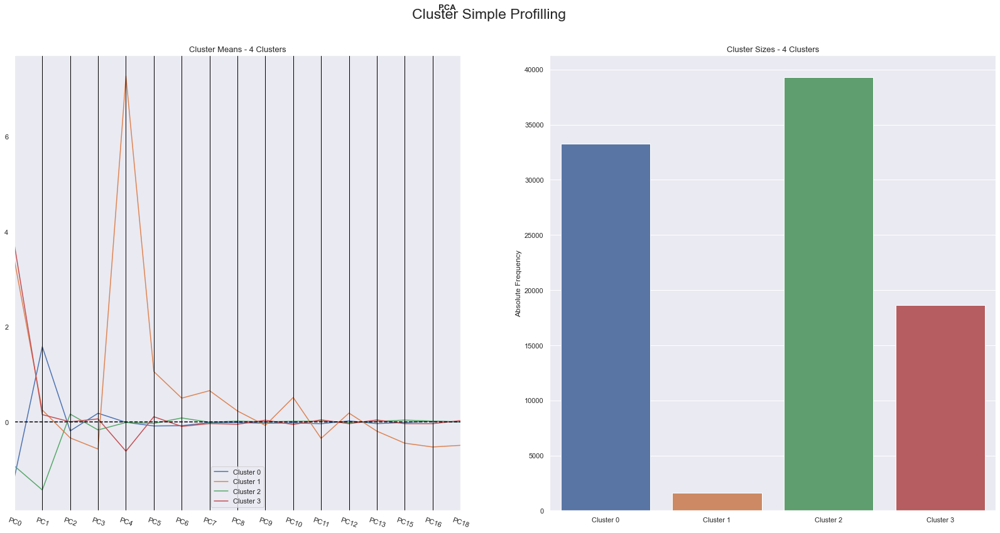

In [310]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_pca2[pc_features.to_list() +['pc_feature']], 
    label_columns = ['pc_feature'], 
    figsize = (28, 13), 
    compar_titles = ["PCA"]
)


#add boxplot, hist to this


### R2 score

In [311]:
r2(df_pca2[pc_features], km_labels)

0.2527240544705499

In [151]:
prof = ProfileReport(d[categorical_data])
prof.to_file(output_file='profiling2.html')

## References:
Deal with nan values:
https://stackoverflow.com/questions/50670080/mice-implementation-in-python
https://stackoverflow.com/questions/45321406/missing-value-imputation-in-python-using-knn
https://stackoverflow.com/questions/45239256/data-imputation-with-fancyimpute-and-pandas
https://stackoverflow.com/questions/54059964/can-not-use-mice-from-fancyimputer-python


Use mean or median:
https://www.wcc.nrcs.usda.gov/normals/median_average.htm